In [0]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [0]:
# jessicali9530/celeba-dataset
! kaggle datasets download greg115/celebrities-100k
! kaggle datasets download kunalupadya/128bcats
# !unzip celeba-dataset.zip

 98% 810M/828M [00:10<00:00, 67.9MB/s]
100% 828M/828M [00:10<00:00, 79.1MB/s]
 98% 681M/698M [00:08<00:00, 86.8MB/s]
100% 698M/698M [00:08<00:00, 81.8MB/s]


In [0]:
 !unzip celebrities-100k.zip
 !unzip 128bcats.zip

Streaming output truncated to the last 5000 lines.
  inflating: resized-cats/cat_55.png  
  inflating: resized-cats/cat_550.png  
  inflating: resized-cats/cat_5500.png  
  inflating: resized-cats/cat_5501.png  
  inflating: resized-cats/cat_5502.png  
  inflating: resized-cats/cat_5503.png  
  inflating: resized-cats/cat_5504.png  
  inflating: resized-cats/cat_5505.png  
  inflating: resized-cats/cat_5506.png  
  inflating: resized-cats/cat_5507.png  
  inflating: resized-cats/cat_5508.png  
  inflating: resized-cats/cat_5509.png  
  inflating: resized-cats/cat_551.png  
  inflating: resized-cats/cat_5510.png  
  inflating: resized-cats/cat_5511.png  
  inflating: resized-cats/cat_5512.png  
  inflating: resized-cats/cat_5513.png  
  inflating: resized-cats/cat_5514.png  
  inflating: resized-cats/cat_5515.png  
  inflating: resized-cats/cat_5516.png  
  inflating: resized-cats/cat_5517.png  
  inflating: resized-cats/cat_5518.png  
  inflating: resized-cats/cat_5519.png  
  inflatin

In [0]:
import os
import time
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import numpy as np
from glob import glob
import datetime
import random
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import files

%matplotlib inline

Instructions for updating:
non-resource variables are not supported in the long term


In [0]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 8x8x1024
        fully_connected = tf.layers.dense(z, 8*8*1024)
        fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 1024))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 8x8x1024 -> 16x16x512
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=512,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 16x16x512 -> 32x32x256
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
        # 32x32x256 -> 64x64x128
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        
        # 64x64x128 -> 128x128x64
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 128x128x64 -> 128x128x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out

In [0]:
def discriminatorp(x, reuse):
    with tf.variable_scope("discriminatorp", reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=64,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=512,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=1024,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 8*8*1024))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [0]:
def discriminatorc(x, reuse):
    with tf.variable_scope("discriminatorc", reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=64,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=512,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=1024,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 8*8*1024))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [0]:
def model_loss(input_realp, input_zp, input_realc, input_zc, output_channel_dim):
    g_model = generator(input_zp, output_channel_dim, True)

    noisy_input_realp = input_realp + tf.random_normal(shape=tf.shape(input_realp),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    noisy_input_realc = input_realc + tf.random_normal(shape=tf.shape(input_realc),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_realp, d_logits_realp = discriminatorp(noisy_input_realp, reuse=False)
    d_model_fakep, d_logits_fakep = discriminatorp(g_model, reuse=True)

    d_model_realc, d_logits_realc = discriminatorc(noisy_input_realc, reuse=False)
    d_model_fakec, d_logits_fakec = discriminatorc(g_model, reuse=True)
    
    d_loss_realp = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_realp,
                                                                         labels=tf.ones_like(d_model_realp)*random.uniform(0.9, 1.0)))
    d_loss_fakep = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fakep,
                                                                         labels=tf.zeros_like(d_model_fakep)))
    d_lossp = tf.reduce_mean(0.5 * (d_loss_realp + d_loss_fakep))

    d_loss_realc = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_realc,
                                                                         labels=tf.ones_like(d_model_realc)*random.uniform(0.9, 1.0)))
    d_loss_fakec = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fakec,
                                                                         labels=tf.zeros_like(d_model_fakec)))
    d_lossc = tf.reduce_mean(0.5 * (d_loss_realc + d_loss_fakec))

    g_lossp = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fakep,
                                                                    labels=tf.ones_like(d_model_fakep)))
    g_lossc = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fakec,
                                                                    labels=tf.ones_like(d_model_fakec)))
    g_loss = tf.reduce_mean(g_lossp*(1-CAT_BALANCE) + g_lossc*CAT_BALANCE)
    return d_lossp, d_lossc, g_loss

In [0]:
def model_optimizers(d_lossp, d_lossc, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_varsp = [var for var in t_vars if var.name.startswith("discriminatorp")]
    d_varsc = [var for var in t_vars if var.name.startswith("discriminatorc")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator') or op.name.startswith('discriminatorp') or op.name.startswith('discriminatorc')]
    
    with tf.control_dependencies(gen_updates):
        d_train_optp = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1).minimize(d_lossp, var_list=d_varsp)
        d_train_optc = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1).minimize(d_lossc, var_list=d_varsc)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1).minimize(g_loss, var_list=g_vars)  
    return d_train_optp, d_train_optc, g_train_opt

In [0]:
def model_inputs(real_dim, z_dim):
    inputs_realp = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_realp')
    inputs_zp = tf.placeholder(tf.float32, (None, z_dim), name="input_zp")
    inputs_realc = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_realc')
    inputs_zc = tf.placeholder(tf.float32, (None, z_dim), name="input_zc")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D1 = tf.placeholder(tf.float32, name="lr_dp")
    learning_rate_D2 = tf.placeholder(tf.float32, name="lr_dc")
    return inputs_realp, inputs_zp, inputs_realc, inputs_zc, learning_rate_G, learning_rate_D1, learning_rate_D2


In [0]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index]
        axis.imshow(image_array)
        image = Image.fromarray(image_array)
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 
    plt.savefig(name+"_"+str(epoch)+".png", bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()

In [0]:
def test(sess, input_zp, input_zc, out_channel_dim, epoch):
    example_zp = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_zp.get_shape().as_list()[-1]])
    example_zc = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_zc.get_shape().as_list()[-1]])
    
    samples = sess.run(generator(input_zp, out_channel_dim, False), feed_dict={input_zp: example_zp, input_zc: example_zc})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, OUTPUT_DIR + "samples", epoch)

In [0]:
def summarize_epoch(epoch, sess, dp_losses, dc_losses, g_losses, inputs_zp, inputs_zc, data_shape, saver):
    print("\nEpoch {}/{}".format(epoch, EPOCHS),
          "\nDp Loss: {:.5f}".format(np.mean(dp_losses[-MINIBATCH_SIZE:])),
          "\nDc Loss: {:.5f}".format(np.mean(dc_losses[-MINIBATCH_SIZE:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-MINIBATCH_SIZE:])))
    fig, ax = plt.subplots()
    plt.plot(dp_losses, label='Discriminator People', alpha=0.6)
    plt.plot(dc_losses, label='Discriminator Cats', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    saver.save(sess, OUTPUT_DIR + "model_" + str(epoch) + ".ckpt")
    test(sess, inputs_zp, inputs_zc, data_shape[3], epoch)
    # files.download(OUTPUT_DIR + "model_" + str(epoch) + ".ckpt.data-00000-of-00001") 
    # files.download(OUTPUT_DIR + "model_" + str(epoch) + ".ckpt.index") 
    # files.download(OUTPUT_DIR + "model_" + str(epoch) + ".ckpt.meta") 


In [0]:
def get_batch(dataset):
    files = random.sample(dataset, BATCH_SIZE)
    batch = []
    for file in files:
        if random.choice([True, False]):
            batch.append(np.asarray(Image.open(file).transpose(Image.FLIP_LEFT_RIGHT)))
        else:
            batch.append(np.asarray(Image.open(file)))                     
    batch = np.asarray(batch)
    normalized_batch = (batch / 127.5) - 1.0
    return normalized_batch, files

In [0]:
def train(data_shape, epoch, checkpoint_path):
    inputs_realp, inputs_zp, inputs_realc, inputs_zc, lr_G, lr_Dp, lr_Dc = model_inputs(data_shape[1:], NOISE_SIZE)
    d_lossp, d_lossc, g_loss = model_loss(inputs_realp, inputs_zp, inputs_realc, inputs_zc, data_shape[3])
    d_optp, d_optc, g_opt = model_optimizers(d_lossp, d_lossc, g_loss)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver()
        if checkpoint_path is not None:
            saver.restore(sess, checkpoint_path)
            
        iteration = 0
        dp_losses = []
        dc_losses = []
        g_losses = []
        
        for epoch in range(EPOCH, EPOCHS):        
            epoch += 1
            epochp_dataset = DATASET_P.copy()
            epochc_dataset = DATASET_C.copy()
            epoch_start_time = time.time()
            
            for i in range(MINIBATCH_SIZE):
                iteration_start_time = time.time()
                iteration += 1
                batch_imagesp, used_filesp = get_batch(epochp_dataset)
                [epochp_dataset.remove(file) for file in used_filesp]
                
                batch_imagesc, used_filesc = get_batch(epochc_dataset)
                [epochc_dataset.remove(file) for file in used_filesc]

                # batch_imagesg = np.concatenate((batch_imagesp, batch_imagesc), axis=0)
                # np.random.shuffle(arr)

                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                # batch_zg = np.concatenate((batch_z, batch_z), axis=0)
                _ = sess.run(d_optp, feed_dict={inputs_realc: batch_imagesc, inputs_realp: batch_imagesp, inputs_zp: batch_z, inputs_zc: batch_z, lr_Dp: LR_D})
                _ = sess.run(d_optc, feed_dict={inputs_realc: batch_imagesc, inputs_realp: batch_imagesp, inputs_zp: batch_z, inputs_zc: batch_z, lr_Dc: LR_D})
                _ = sess.run(g_opt, feed_dict={inputs_realp: batch_imagesp, inputs_realc: batch_imagesc, inputs_zp: batch_z, inputs_zc: batch_z, lr_G: LR_G})
                dp_losses.append(d_lossp.eval({inputs_realc: batch_imagesc, inputs_realp: batch_imagesp, inputs_zp: batch_z, inputs_zc: batch_z}))
                dc_losses.append(d_lossc.eval({inputs_realc: batch_imagesc, inputs_realp: batch_imagesp, inputs_zp: batch_z, inputs_zc: batch_z}))
                g_losses.append(g_loss.eval({inputs_zp: batch_z, inputs_zc: batch_z}))

                # dp_losses.append(d_lossp.eval({input_z: batch_z, input_images: batch_imagesp}))
                # dc_losses.append(d_lossc.eval({input_z: batch_z, input_images: batch_imagesc}))
                # g_losses.append(g_loss.eval({input_z: batch_z}))
                
                elapsed_time = round((time.time()-epoch_start_time)/60,2)
                iteration_time = round(time.time()-iteration_start_time, 3)
                remaining_files = len(epochp_dataset)+len(epochc_dataset)
                print("\rEpoch: " + str(epoch) +
                      ", iteration: " + str(iteration) + 
                      ", dp_loss: " + str(round(dp_losses[-1], 3)) +
                      ", dc_loss: " + str(round(dc_losses[-1], 3)) +
                      ", g_loss: " + str(round(g_losses[-1], 3)) +
                      ", duration: " + str(elapsed_time) + 
                      ", minutes remaining: " + str(round(remaining_files/BATCH_SIZE*iteration_time/60, 1)) +
                      ", remaining files in batch: " + str(remaining_files)
                      , sep=' ', end=' ', flush=True)
                # summarize_epoch(epoch, sess, dp_losses, dc_losses, g_losses, inputs_zp, inputs_zc, data_shape, saver)
            summarize_epoch(epoch, sess, dp_losses, dc_losses, g_losses, inputs_zp, inputs_zc, data_shape, saver)

In [0]:
# Hyperparameters
IMAGE_SIZE = 128
NOISE_SIZE = 100
CAT_BALANCE = 0.3333
LR_D = 0.00001
LR_G = 0.0002
BATCH_SIZE = 64
EPOCH = 0 # Non-zero only if we are resuming training with model checkpoint
EPOCHS = 20 #EPOCH + number of epochs to perform
BETA1 = 0.5
WEIGHT_INIT_STDDEV = 0.02
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5

In [0]:
BASE_PATH = "./"
INPUT_DATA_DIR = BASE_PATH + "resized-cats/"
OUTPUT_DIR = "./"
DATASET_C = [INPUT_DATA_DIR + str(line) for line in os.listdir('resized-cats')]
DATASET_SIZE = len(DATASET_C) 
MINIBATCH_SIZE = DATASET_SIZE // BATCH_SIZE
print(DATASET_C)
print(DATASET_SIZE)

['./resized-cats/cat_7356.png', './resized-cats/cat_12999.png', './resized-cats/cat_12536.png', './resized-cats/cat_5423.png', './resized-cats/cat_20168.png', './resized-cats/cat_6943.png', './resized-cats/cat_17174.png', './resized-cats/cat_17057.png', './resized-cats/cat_3541.png', './resized-cats/cat_21459.png', './resized-cats/cat_5389.png', './resized-cats/cat_23306.png', './resized-cats/cat_27340.png', './resized-cats/cat_21667.png', './resized-cats/cat_8040.png', './resized-cats/cat_12378.png', './resized-cats/cat_19161.png', './resized-cats/cat_28576.png', './resized-cats/cat_29450.png', './resized-cats/cat_16245.png', './resized-cats/cat_10156.png', './resized-cats/cat_2084.png', './resized-cats/cat_2930.png', './resized-cats/cat_28528.png', './resized-cats/cat_15591.png', './resized-cats/cat_22037.png', './resized-cats/cat_6842.png', './resized-cats/cat_3668.png', './resized-cats/cat_28017.png', './resized-cats/cat_20731.png', './resized-cats/cat_6556.png', './resized-cats/ca

In [0]:
# Data (https://www.kaggle.com/greg115/celebrities-100k)
BASE_PATH = "./"
DATASET_LIST_PATH = BASE_PATH + "100k.txt"
INPUT_DATA_DIR = BASE_PATH + "100k/100k/"
OUTPUT_DIR = "./"
DATASET_P = [INPUT_DATA_DIR + str(line).rstrip() for line in open(DATASET_LIST_PATH,"r")]
DATASET_P = DATASET_P[:DATASET_SIZE]
# DATASET_SIZE = len(DATASET) 
MINIBATCH_SIZE = DATASET_SIZE // BATCH_SIZE
# Optional - model path to resume training
#MODEL_PATH = BASE_PATH + "models/" + "model_" + str(EPOCH) + ".ckpt"

Instructions for updating:
Use keras.layers.Dense instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.BatchNormalization` documentation).
Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Epoch: 1, iteration: 466, dp_loss: 2.482, dc_loss: 0.587, g_loss: 0.502, duration: 13.8, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 1/20 
Dp Loss: 4.73361 
Dc Loss: 2.81726 
G Loss: 0.46650


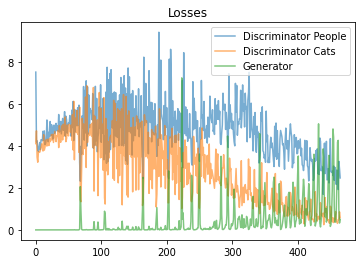

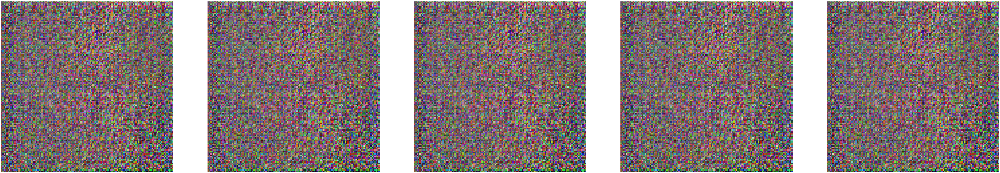

Epoch: 2, iteration: 932, dp_loss: 0.25, dc_loss: 0.12, g_loss: 2.427, duration: 13.66, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 2/20 
Dp Loss: 0.97413 
Dc Loss: 0.23478 
G Loss: 2.25817


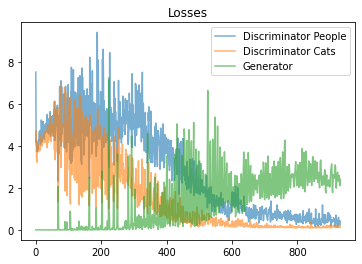

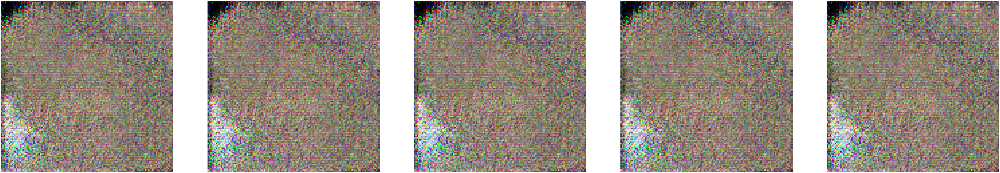

Epoch: 3, iteration: 1398, dp_loss: 0.629, dc_loss: 0.256, g_loss: 1.453, duration: 13.63, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 3/20 
Dp Loss: 1.01360 
Dc Loss: 0.45201 
G Loss: 1.29641


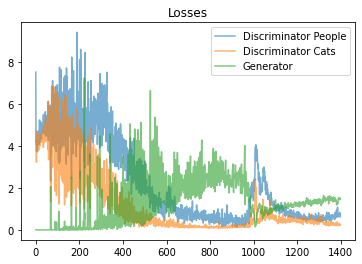

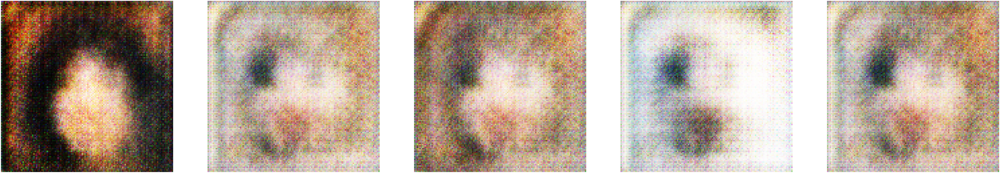

Epoch: 4, iteration: 1864, dp_loss: 0.529, dc_loss: 0.106, g_loss: 1.938, duration: 13.66, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 4/20 
Dp Loss: 0.44278 
Dc Loss: 0.19831 
G Loss: 1.97747


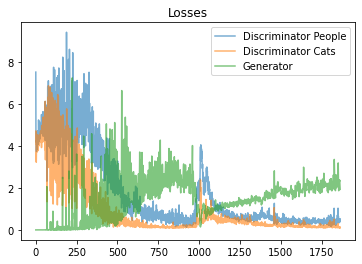

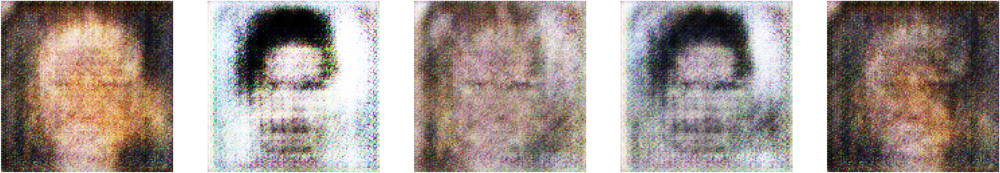

Epoch: 5, iteration: 2330, dp_loss: 0.386, dc_loss: 0.092, g_loss: 2.718, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 5/20 
Dp Loss: 0.40690 
Dc Loss: 0.10578 
G Loss: 2.52314


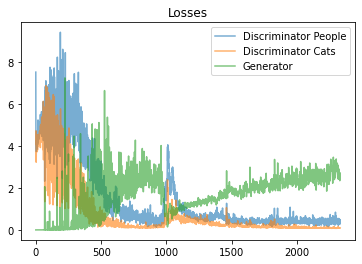

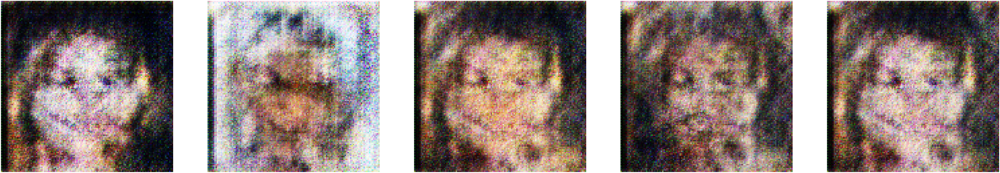

Epoch: 6, iteration: 2796, dp_loss: 0.483, dc_loss: 0.077, g_loss: 2.382, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 6/20 
Dp Loss: 0.42749 
Dc Loss: 0.08402 
G Loss: 2.99437


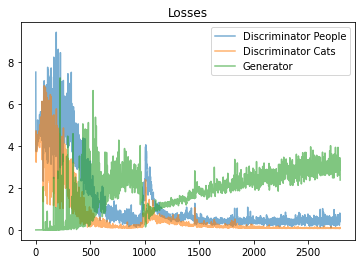

Instructions for updating:
Use standard file APIs to delete files with this prefix.


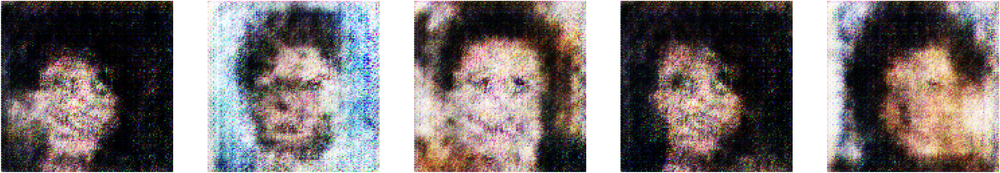

Epoch: 7, iteration: 3262, dp_loss: 0.423, dc_loss: 0.085, g_loss: 2.934, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 7/20 
Dp Loss: 0.46506 
Dc Loss: 0.07631 
G Loss: 3.17466


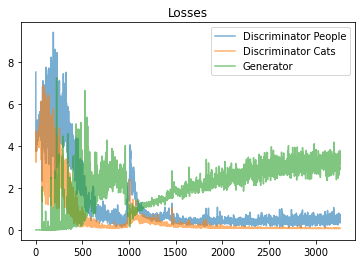

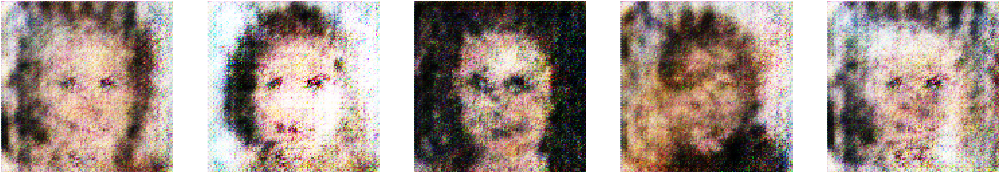

Epoch: 8, iteration: 3728, dp_loss: 0.786, dc_loss: 0.069, g_loss: 3.655, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 8/20 
Dp Loss: 0.51299 
Dc Loss: 0.07247 
G Loss: 3.24445


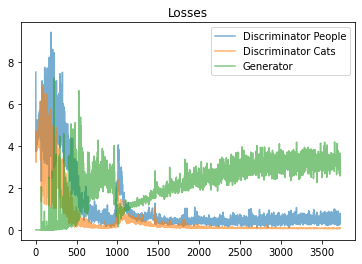

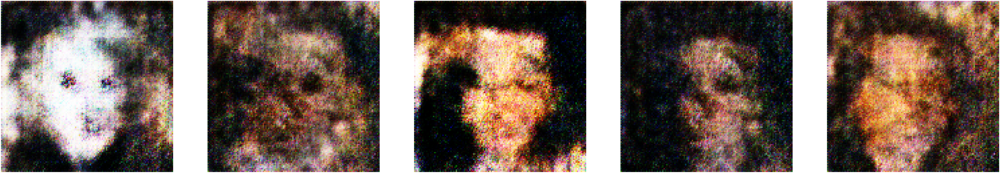

Epoch: 9, iteration: 4194, dp_loss: 0.956, dc_loss: 0.067, g_loss: 3.847, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 9/20 
Dp Loss: 0.53712 
Dc Loss: 0.07153 
G Loss: 3.34171


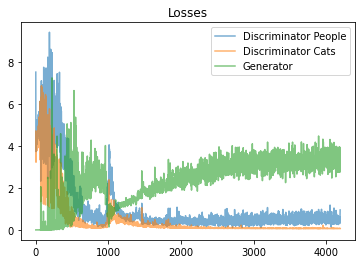

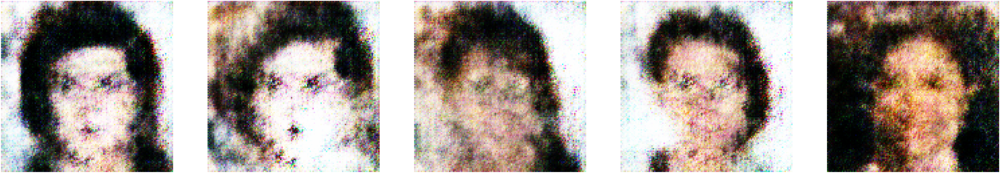

Epoch: 10, iteration: 4660, dp_loss: 0.429, dc_loss: 0.073, g_loss: 3.477, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 10/20 
Dp Loss: 0.54400 
Dc Loss: 0.06981 
G Loss: 3.29059


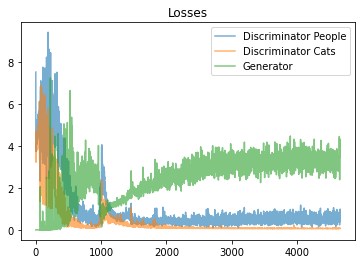

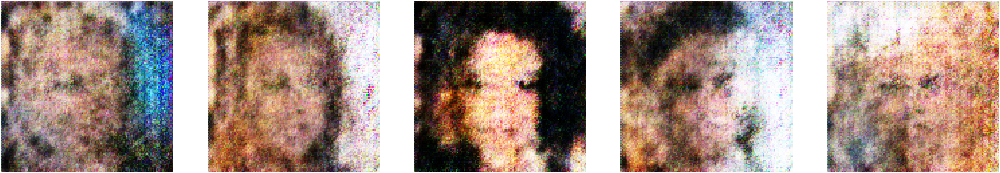

Epoch: 11, iteration: 5126, dp_loss: 0.657, dc_loss: 0.069, g_loss: 3.012, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 11/20 
Dp Loss: 0.54536 
Dc Loss: 0.06947 
G Loss: 3.29301


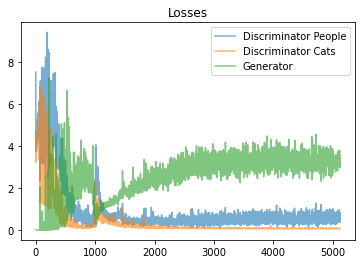

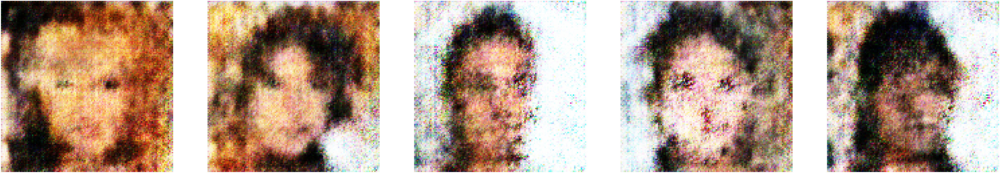

Epoch: 12, iteration: 5592, dp_loss: 0.486, dc_loss: 0.066, g_loss: 2.947, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 12/20 
Dp Loss: 0.55974 
Dc Loss: 0.06834 
G Loss: 3.23741


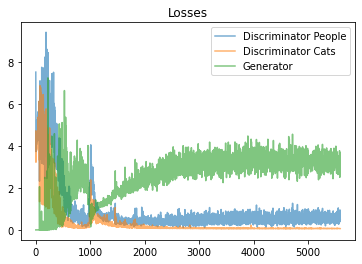

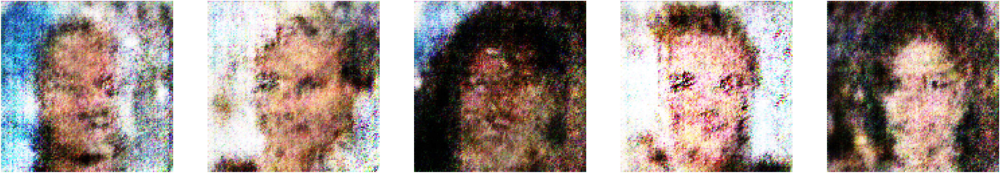

Epoch: 13, iteration: 6058, dp_loss: 0.676, dc_loss: 0.068, g_loss: 3.08, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 13/20 
Dp Loss: 0.55766 
Dc Loss: 0.06746 
G Loss: 3.30468


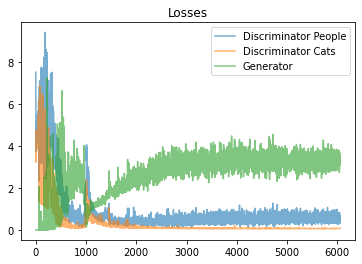

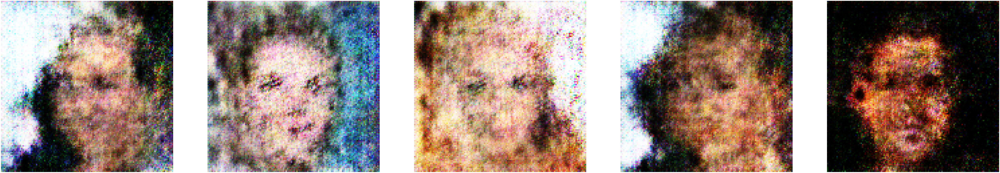

Epoch: 14, iteration: 6524, dp_loss: 0.892, dc_loss: 0.071, g_loss: 2.85, duration: 13.68, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 14/20 
Dp Loss: 0.56596 
Dc Loss: 0.06735 
G Loss: 3.28427


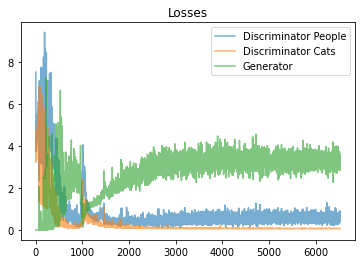

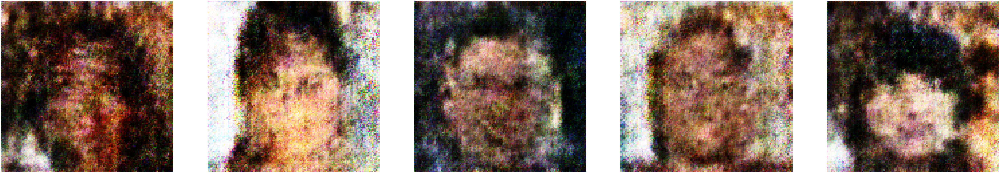

Epoch: 15, iteration: 6990, dp_loss: 0.544, dc_loss: 0.07, g_loss: 3.236, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 15/20 
Dp Loss: 0.56249 
Dc Loss: 0.06719 
G Loss: 3.30321


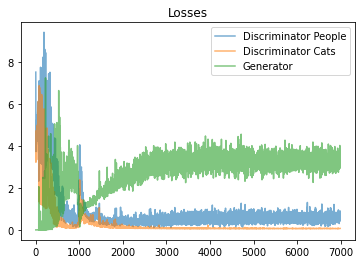

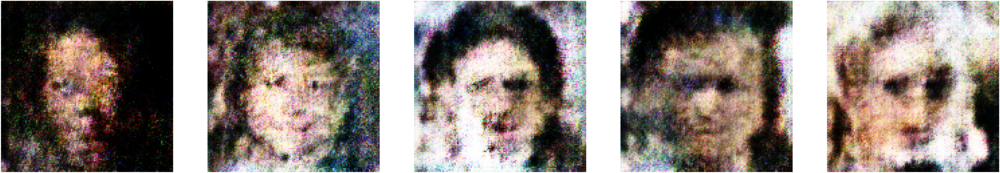

Epoch: 16, iteration: 7456, dp_loss: 0.622, dc_loss: 0.065, g_loss: 3.055, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 16/20 
Dp Loss: 0.56858 
Dc Loss: 0.06679 
G Loss: 3.31638


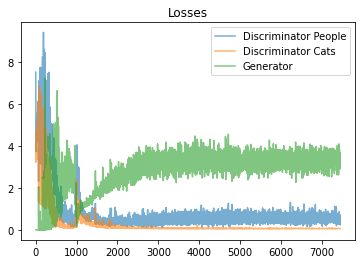

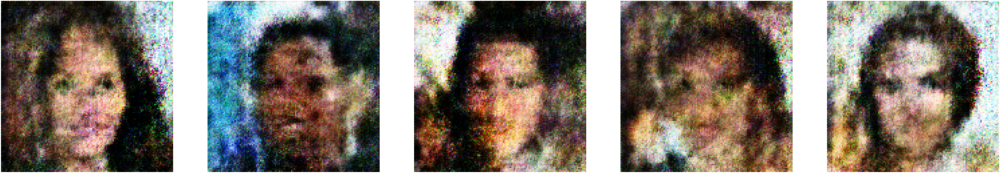

Epoch: 17, iteration: 7922, dp_loss: 0.503, dc_loss: 0.066, g_loss: 3.215, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 17/20 
Dp Loss: 0.58310 
Dc Loss: 0.06696 
G Loss: 3.34938


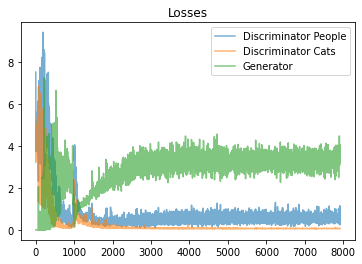

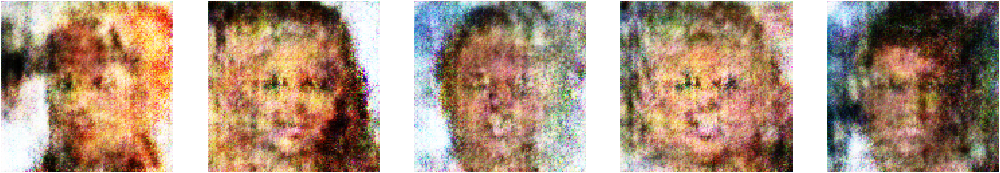

Epoch: 18, iteration: 8388, dp_loss: 0.379, dc_loss: 0.066, g_loss: 3.051, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 18/20 
Dp Loss: 0.58553 
Dc Loss: 0.06656 
G Loss: 3.31063


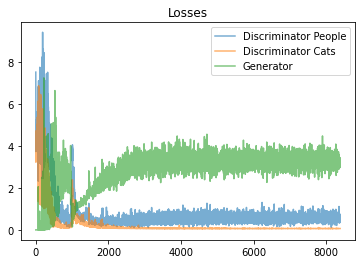

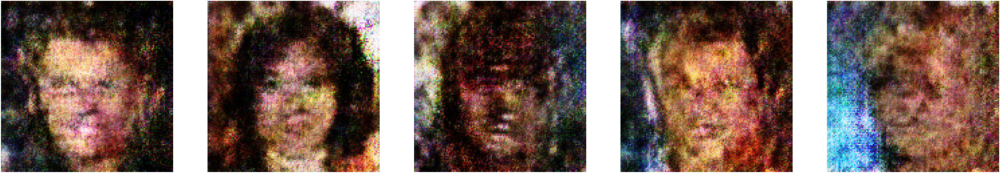

Epoch: 19, iteration: 8854, dp_loss: 0.752, dc_loss: 0.065, g_loss: 3.532, duration: 13.65, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 19/20 
Dp Loss: 0.57891 
Dc Loss: 0.06628 
G Loss: 3.31736


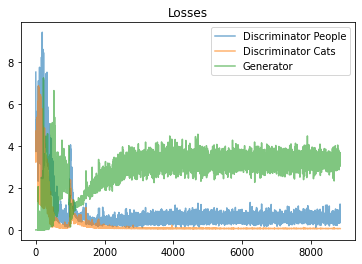

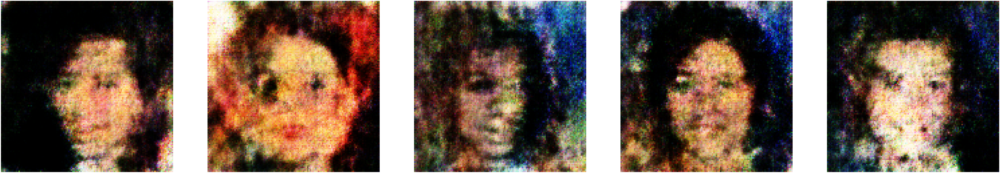

Epoch: 20, iteration: 9320, dp_loss: 0.558, dc_loss: 0.067, g_loss: 3.253, duration: 13.64, minutes remaining: 0.0, remaining files in batch: 38 
Epoch 20/20 
Dp Loss: 0.58548 
Dc Loss: 0.06599 
G Loss: 3.38512


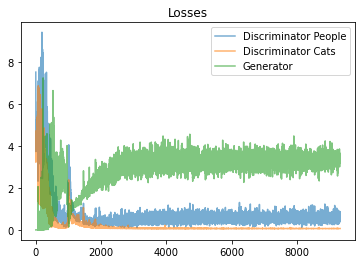

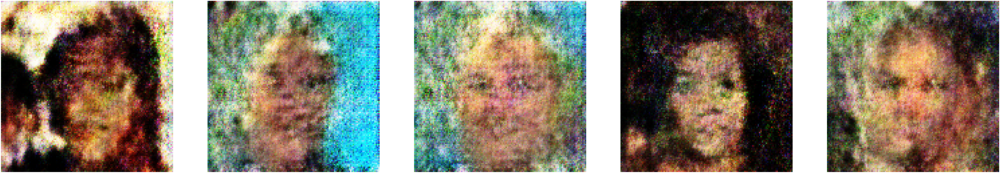

In [0]:

# Training
with tf.Graph().as_default():
    train(data_shape=(DATASET_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3),
          epoch=EPOCH,
          checkpoint_path=None)